## EC523 HW#5: Music Generation with LSTMs
Author: Sadie Allen

Released: April 2nd, 2024

Due: April 23rd, 2024

In this homework, you will be applying autoregressive models to the problem of generating symbolic music.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!sudo apt install -y fluidsynth

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fluid-soundfont-gm libevdev2 libfluidsynth3 libgudev-1.0-0 libinput-bin
  libinput10 libinstpatch-1.0-2 libmd4c0 libmtdev1 libqt5core5a libqt5dbus5
  libqt5gui5 libqt5network5 libqt5svg5 libqt5widgets5 libwacom-bin
  libwacom-common libwacom9 libxcb-icccm4 libxcb-image0 libxcb-keysyms1
  libxcb-render-util0 libxcb-util1 libxcb-xinerama0 libxcb-xinput0 libxcb-xkb1
  libxkbcommon-x11-0 qsynth qt5-gtk-platformtheme qttranslations5-l10n
  timgm6mb-soundfont
Suggested packages:
  fluid-soundfont-gs qt5-image-formats-plugins qtwayland5 jackd
The following NEW packages will be installed:
  fluid-soundfont-gm fluidsynth libevdev2 libfluidsynth3 libgudev-1.0-0
  libinput-bin libinput10 libinstpatch-1.0-2 libmd4c0 libmtdev1 libqt5core5a
  libqt5dbus5 libqt5gui5 libqt5network5 libqt5svg5 libqt5widgets5 libwacom-bin
  libwacom-common libwacom9 libx

In [3]:
!pip install --upgrade pyfluidsynth

  Preparing metadata (setup.py) ... done
  Created wheel for pyfluidsynth: filename=pyFluidSynth-1.3.3-py3-none-any.whl size=19185 sha256=ec126eada089869f91717cae6891acac24344a4e8a6987c2bbb5a6671b763bb7
  Stored in directory: /root/.cache/pip/wheels/e6/9c/2b/b4b194cbb100d6f20136a22b2f76cd329b1a21139ed26c9775
Successfully built pyfluidsynth


In [4]:
!pip install pretty_midi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 20.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.6/54.6 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 8.6 MB/s eta 0:00:00
  Created wheel for pretty_midi: filename=pretty_midi-0.2.10-py3-none-any.whl size=5592289 sha256=8fc2c27e19ccf650b3ccb44d6f978c07bf0f9a08f7a2c9b0279a07a9e3cd125d
  Stored in directory: /root/.cache/pip/wheels/cd/a5/30/7b8b7f58709f5150f67f98fde4b891ebf0be9ef07a8af49f25
Successfully built pretty_midi
  Attempting uninstall: packaging
    Found existing installation: packaging 24.0
    Uninstalling packaging-24.0:
      Successfully uninstalled packaging-24.0


In [5]:
### IMPORTS ###
import os
import librosa
import pretty_midi
import matplotlib.pyplot as plt
from tqdm import tqdm
import math
import statistics
from IPython.display import Audio

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import scipy

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Part 1: Loading & Understanding the Data (12 points, 2 per part)
The dataset we will be using is a subset of the [Lakh MIDI Dataset](https://colinraffel.com/projects/lmd/). MIDI (Musical Instrument Digital Interface) is a widely used communication protocol and file format that allows communication between electronic musical instruments and computers. It essentially stores the same information that is communicated in sheet music (what notes play when and how loudly). As opposed to a wav file, which stores the actual waveform of a musical performance, MIDI files carry much less information and thus are significantly smaller.

The dataset you will be using for this homework has been filtered and preprocessed in the following ways:
- Standardized to the same tempo (120bpm) and key (C/Am)
- Each MIDI file contains exactly one (non-drum) track
- Dataset only contains monophonic tracks, i.e. there is a maximum of one note playing at any given time.
- Removed excessively sparse tracks (tracks with a note playing <30% of the time)

We can use the [pretty_midi](https://craffel.github.io/pretty-midi/) library to manipulate MIDI files in Python. In this section of the homework, you will familiarize yourself with the training data and ways to view, listen to, and manipulate it.

**Problem 1:** Upload the MIDI dataset to your Google Drive and mount it to the notebook. Load a pretty_midi object for the file 'ABBA_Mamma_Mia_t7.mid' and answer the following questions about it:

1.1 How long is the MIDI in seconds?

1.2 What is the name of the instrument that the track is set to?

1.3 How many total notes are played?

1.4 What are the names of the pitches of the first 10 notes in the MIDI?

In [6]:
#### YOUR CODE HERE ####
# Consult the pretty_midi documentation page for help with answering any of these questions :)
data_directory = '/content/drive/MyDrive/EC523/ec523_MIDI_DATA/dense_and_cropped/'
pm = pretty_midi.PrettyMIDI(data_directory + 'ABBA_Mamma_Mia_t7.mid')

Now that we understand the PrettyMIDI class a little bit better, it would also be helpful for us to be able to visualize and listen to the MIDI data.

For visualization, we first need to convert our MIDI object into a **piano roll**. A piano roll is a 2-D representation of MIDI where the X axis represents time and the Y axis represents pitch. When we represent MIDI this way, we can easily graph it. Luckily, the pretty_midi library has a built-in function for converting MIDI objects into piano rolls. The code below uses librosa's specshow library to display a piano roll, which is nice because you can automatically have the y-axis display note names.

In order to create a piano roll for a given MIDI, we need to choose a time subdivision to use for the x-axis. Since the MIDIs are standardized to 120bpm, we know that the length of 1 "beat" (typically a quarter note) is 1/2 a second. We will choose a time subdivision of 1/16th of a second, which will allow us to represent 32nd notes.

1.5 Try using the function below to plot the first 15 seconds of the Mamma Mia MIDI object from above.

<ipython-input-26-26bed60a5658>:21: UserWarning: Frequency axis exceeds Nyquist. Did you remember to set all spectrogram parameters in specshow?
  librosa.display.specshow(pianoroll[start_pitch:end_pitch],



1.1: length in seconds
203.92499999999998

1.2: instrument
Bright Acoustic Piano

1.3: total notes played (dependent on fs)
89

1.4: total length of instrument.notes array
426

1.5: first 10 notes
G4
C5
B4
C5
D5
E5
C5
C5
B4
C5



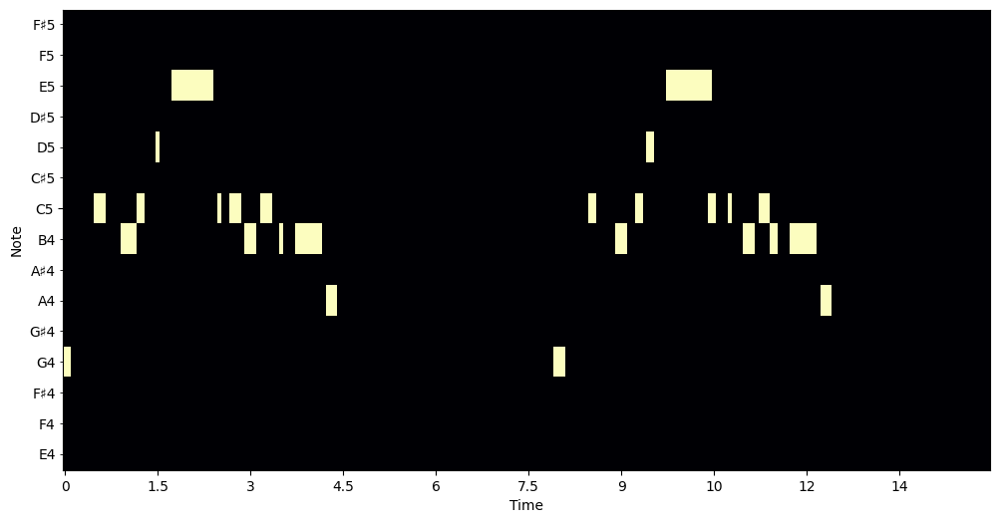

In [26]:
def plot_piano_roll(pm, length, fs=16):
    plt.figure(figsize=(12, 6))
    # Use librosa's specshow function for displaying the piano roll
    pianoroll = pm.get_piano_roll(fs) #=fs)

    pianoroll[pianoroll > 0] = 1 # sets all the velocities to be the same
    pianoroll = pianoroll[:, :fs*length]

    # print("pianoroll plot array")
    # print(pianoroll)

    nonzero_row_indices = np.nonzero(np.count_nonzero(pianoroll, axis=1))
    start_pitch = max(np.min(nonzero_row_indices) - 3, 0)

    # print("pitch start/end")
    # print(start_pitch)

    end_pitch = min(np.max(nonzero_row_indices) + 3, 127)
    # print(end_pitch)

    librosa.display.specshow(pianoroll[start_pitch:end_pitch],
                             hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note',
                             fmin=pretty_midi.note_number_to_hz(start_pitch))

    print()
    #1.1 How long is the MIDI in seconds?
    print("1.1: length in seconds")
    #print(len(pianoroll)/fs)
    print(pm.get_end_time())
    print()

    #1.2 What is the name of the instrument that the track is set to?
    print("1.2: instrument")
    #print(pm.instruments[0].name)
    print(pretty_midi.program_to_instrument_name(pm.instruments[0].program))
    print()

    #1.3 How many total notes are played?
    print("1.3: total notes played (dependent on fs)")
    print(np.count_nonzero(pianoroll))
    print()

    print("1.4: total length of instrument.notes array")
    print(len(pm.instruments[0].notes))
    print()


    #1.4 What are the names of the pitches of the first 10 notes in the MIDI?
    print("1.5: first 10 notes")
    for i in range(0,10):
        print(pretty_midi.note_number_to_name(pm.instruments[0].notes[i].pitch))
    print()

    # print("pianoroll plot array")
    # print(pianoroll)





### YOUR CODE HERE
#plot_piano_roll(pm, 15, 160)
plot_piano_roll(pm, 15)

It would also be nice to be listen to our MIDIs! We can do that using pretty_midi's fluidsynth method.

1.6 Use the code below to render 60 seconds of audio for our Mamma Mia MIDI.

In [8]:
def display_audio(pm, seconds=None, fs=16000):
  waveform = pm.fluidsynth(fs=fs)
  if seconds:
    waveform = waveform[:seconds*fs]
  return Audio(waveform, rate=fs)

### YOUR CODE HERE
display_audio(pm, 60, fs=16000)

### Part 2: Creating our Representation. (15 points)
An LSTM will not be able to understand a MIDI object or a piano roll object. LSTMs take as input sequences of integers, so we need to convert our MIDIs into this kind of representation. Since we are working strictly with monophonic MIDIs, there is a very natural way to represent our dataset. We will create a dictionary in which each integer key corresponds to a distinct pitch (0-127) and then add three extra tokens for rests, beginning-of-sequence, and end-of-sequence.

2.1 Define a token dictionary with integer keys to represent the 128 MIDI pitches, a `<rest>` token, a `<bos>` token, and an `<eos>` token. Create an inverse token dictionary to be used for going from sequence representation back to MIDI. (10 points)

In [9]:
### YOUR CODE HERE
# Need a token dictionary and an inverse token dictionary
token_dict = {'<rest>': 128, '<eos>': 129, '<bos>': 130}
#data_dir = {128: '<rest>', 129: '<eos>', 130: '<bos>'}
inv_token_dict = {128: '<rest>', 129: '<eos>', 130: '<bos>'}

for i in range(0,128):
    #print(i)
    i_string = str(i)
    token_dict[i] = i
    #data_dir[i] = i
    inv_token_dict[i] = i

print("token_dict")
print(token_dict)
#print("data_dir")
#print(data_dir)
print("inv_token_dict")
print(inv_token_dict)

token_dict
{'<rest>': 128, '<eos>': 129, '<bos>': 130, 0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6, 7: 7, 8: 8, 9: 9, 10: 10, 11: 11, 12: 12, 13: 13, 14: 14, 15: 15, 16: 16, 17: 17, 18: 18, 19: 19, 20: 20, 21: 21, 22: 22, 23: 23, 24: 24, 25: 25, 26: 26, 27: 27, 28: 28, 29: 29, 30: 30, 31: 31, 32: 32, 33: 33, 34: 34, 35: 35, 36: 36, 37: 37, 38: 38, 39: 39, 40: 40, 41: 41, 42: 42, 43: 43, 44: 44, 45: 45, 46: 46, 47: 47, 48: 48, 49: 49, 50: 50, 51: 51, 52: 52, 53: 53, 54: 54, 55: 55, 56: 56, 57: 57, 58: 58, 59: 59, 60: 60, 61: 61, 62: 62, 63: 63, 64: 64, 65: 65, 66: 66, 67: 67, 68: 68, 69: 69, 70: 70, 71: 71, 72: 72, 73: 73, 74: 74, 75: 75, 76: 76, 77: 77, 78: 78, 79: 79, 80: 80, 81: 81, 82: 82, 83: 83, 84: 84, 85: 85, 86: 86, 87: 87, 88: 88, 89: 89, 90: 90, 91: 91, 92: 92, 93: 93, 94: 94, 95: 95, 96: 96, 97: 97, 98: 98, 99: 99, 100: 100, 101: 101, 102: 102, 103: 103, 104: 104, 105: 105, 106: 106, 107: 107, 108: 108, 109: 109, 110: 110, 111: 111, 112: 112, 113: 113, 114: 114, 115: 115, 116: 

We will also chunk the MIDI data into shorter segments to make everything more manageable. Let's consider chunks that are 4 bars long. With a 32nd note subdivision, each chunk will be 128 tokens long, plus a `<bos>` and `<eos>` token, so 130 total. We will want to exclude chunks that are majority rests. Let's write some code to create our token sequences.

In [10]:
import random

def create_token_sequences(midi, token_dict, fs=16, seq_len=128, add_bos_eos=True):
  pianoroll = midi.get_piano_roll(fs)
  pianoroll[pianoroll>0]=1
  total_len = pianoroll.shape[1] // 128
  seqs = []
  for i in range(total_len):
    vel_sum = np.sum(pianoroll[:,i*seq_len:(i+1)*seq_len])
    if vel_sum > seq_len*(0.3):
      new_seq = []
      if add_bos_eos:
        new_seq.append(token_dict['<bos>'])
      for j in range(seq_len):
        nonzero_indices = np.nonzero(pianoroll[:,i*seq_len + j])
        if len(nonzero_indices[0]) != 0:
          new_seq.append(nonzero_indices[0][0])
        else:
          new_seq.append(token_dict['<rest>'])
      if add_bos_eos:
        new_seq.append(token_dict['<eos>'])
      seqs.append(new_seq)
  return seqs

def create_all_token_sequences(data_dir, token_dict, fs=16, seq_len=128, test_prop=0.10):
  file_names = os.listdir(data_directory)
  all_sequences = []
  for f in tqdm(file_names):
    pm = pretty_midi.PrettyMIDI(data_directory + f)
    cur_seqs = create_token_sequences(pm, token_dict, fs=fs, seq_len=seq_len)
    all_sequences += cur_seqs

  # shuffle list
  random.shuffle(all_sequences)
  test_seqs = all_sequences[:int(len(all_sequences)*test_prop)]
  train_seqs = all_sequences[int(len(all_sequences)*test_prop):]
  return train_seqs, test_seqs

### YOUR CODE HERE
# Call create_all_token_sequences to create test and train sequences
train_seqs, test_seqs = [],[]
train_seqs, test_seqs = create_all_token_sequences(data_directory, token_dict, fs = 16)
print()
print(len(train_seqs), len(test_seqs))

100%|██████████| 1367/1367 [00:58<00:00, 23.46it/s]


23101 2566


What if we want to go back the other way? We need an inverse function so we can convert any sequences that our model generates into MIDI objects! It's pretty straightforward to go from sequence to pianoroll. Going from pianoroll to MIDI is a little more complicated, so we provided code for that.

2.2 Finish the function below by creating a pianoroll given a sequence of pitch tokens. (5 points)

In [11]:
def piano_roll_to_pretty_midi(piano_roll, fs=16, program=0):
    '''
    Parameters
    ----------
    piano_roll : np.ndarray
    fs : int
        Sampling frequency of the columns
    Returns
    -------
    midi_object : pretty_midi.PrettyMIDI
    '''
    notes, frames = piano_roll.shape
    pm = pretty_midi.PrettyMIDI()
    instrument = pretty_midi.Instrument(program=program)

    # pad 1 column of zeros so we can acknowledge inital and ending events
    piano_roll = np.pad(piano_roll, [(0, 0), (1, 1)], 'constant')

    # use changes in velocities to find note on / note off events
    velocity_changes = np.nonzero(np.diff(piano_roll).T)

    # keep track on velocities and note on times
    prev_velocities = np.zeros(notes, dtype=int)
    note_on_time = np.zeros(notes)

    for time, note in zip(*velocity_changes):
        # use time + 1 because of padding above
        velocity = piano_roll[note, time + 1]
        time = time / fs
        if velocity > 0:
            if prev_velocities[note] == 0:
                note_on_time[note] = time
                prev_velocities[note] = velocity
        else:
            pm_note = pretty_midi.Note(
                velocity=prev_velocities[note],
                pitch=note,
                start=note_on_time[note],
                end=time)
            instrument.notes.append(pm_note)
            prev_velocities[note] = 0
    pm.instruments.append(instrument)
    return pm

def mono_seq_to_pretty_midi(seq, inv_token_dict):
    # note for later, inv_token_dict = data_dir
    ### YOUR CODE HERE! Take a sequence, create a pianoroll
    #   to pass to piano_roll_to_pretty_midi
    #   check for BOS, EOS
    # print("seq")
    # print(seq)
    # pianoroll = np.zeros((128,len(seq),), dtype=np.dtypes.StrDType)
    pianoroll = np.zeros((128,len(seq),))

    for i in range(0,len(seq)):
        # print("i, seq[i]")
        # print(i)
        # print(seq[i])
        if str(seq[i]) == '130' or str(seq[i]) == '129' or str(seq[i]) == '128':
            continue
        else:
            #pianoroll[0,i] = inv_token_dict[seq[i]]
            pianoroll[seq[i],i] = 1

    midi = piano_roll_to_pretty_midi(pianoroll)

    for note in midi.instruments[0].notes:
        note.velocity = 100

    return pianoroll,midi

<ipython-input-21-47979c43bbc1>:21: UserWarning: Frequency axis exceeds Nyquist. Did you remember to set all spectrogram parameters in specshow?
  librosa.display.specshow(pianoroll[start_pitch:end_pitch],


length in seconds
203.92499999999998
instrument
Bright Acoustic Piano
total notes played (dependent on fs)
257
total length of instrument.notes array
426
first 10 notes
G4
C5
B4
C5
D5
E5
C5
C5
B4
C5


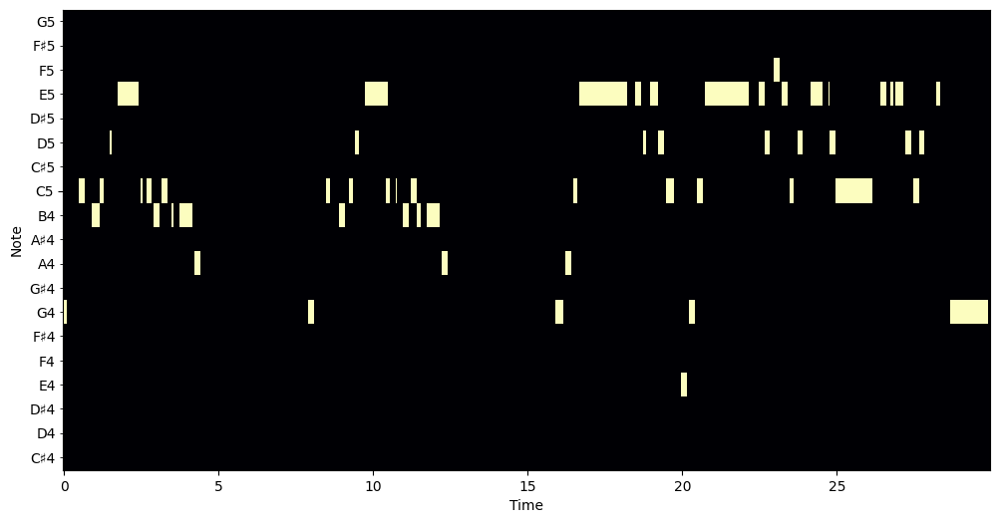

In [22]:
plot_piano_roll(pm, 30)
display_audio(pm, 30)

In [13]:
### Unit test: go from MIDI to pianoroll and plot. Then go to sequence, back to MIDI then plot
import itertools

tokens = create_token_sequences(pm, token_dict, fs=16, seq_len=128, add_bos_eos=False)
print(len(tokens))
all_tokens = list(itertools.chain.from_iterable(tokens)) # concatenate all the token list chunks
print(len(all_tokens))

23
2944


<ipython-input-21-47979c43bbc1>:21: UserWarning: Frequency axis exceeds Nyquist. Did you remember to set all spectrogram parameters in specshow?
  librosa.display.specshow(pianoroll[start_pitch:end_pitch],


length in seconds
183.875
instrument
Acoustic Grand Piano
total notes played (dependent on fs)
256
total length of instrument.notes array
392
first 10 notes
G4
C5
B4
C5
D5
E5
C5
C5
B4
C5
length in seconds
183.875
instrument
Acoustic Grand Piano
total notes played (dependent on fs)
1355
total length of instrument.notes array
392
first 10 notes
G4
C5
B4
C5
D5
E5
C5
C5
B4
C5


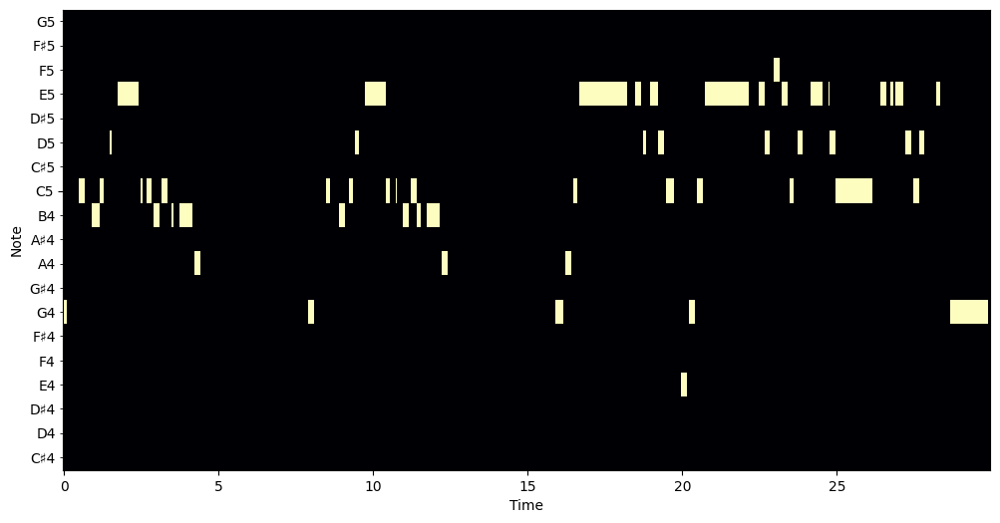

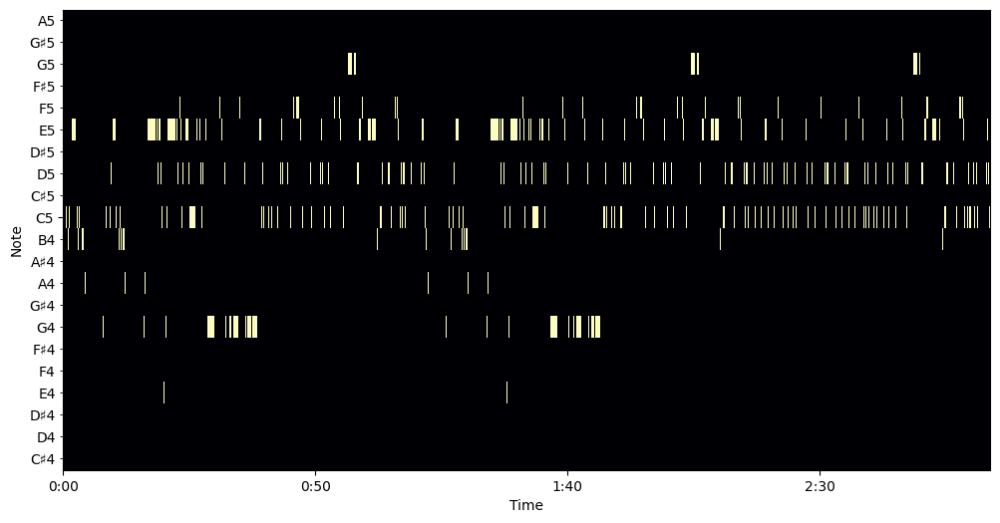

In [23]:
new_pr, new_pm = mono_seq_to_pretty_midi(all_tokens, inv_token_dict)
plot_piano_roll(new_pm, 30)
plot_piano_roll(new_pm, len(all_tokens))
display_audio(new_pm, len(all_tokens))

### Part 3: LSTMs (30 Points)

Now we have to define an autoregressive model. We have provided the init function and supporting weight initialization functions.

3.1 Fill in the forward pass of the LSTM that should embed the source sequence, send it through the LSTM, and then generate a prediction with the fully connected layer. You can also add dropout layers to try to reduce overfitting/create a more robust model. (10 points)

In [ ]:
class LSTM(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, num_layers, dropout_rate,
                tie_weights):

        super().__init__()
        self.num_layers = num_layers
        self.hidden_dim = hidden_dim
        self.embedding_dim = embedding_dim

        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, num_layers=num_layers,
                    dropout=dropout_rate, batch_first=True)
        self.dropout = nn.Dropout(dropout_rate)
        self.fc = nn.Linear(hidden_dim, vocab_size)

        if tie_weights:
            assert embedding_dim == hidden_dim, 'cannot tie, check dims'
            self.embedding.weight = self.fc.weight
        self.init_weights()

    def forward(self, src, hidden):
        # TO DO
        # embed = self.embedding(src)
        # prediction, hidden = self.lstm(embed.view(len(src), 1, -1))
        # prediction = self.dropout(prediction)
        # pred_fc = self.fc(prediction.view(len(src), -1))
        # pred_softmax = torch.nn.functional.log_softmax(pred_fc, dim=1)

        embed = self.embedding(src)
        prediction, hidden = self.lstm(embed)
        prediction = self.dropout(prediction)
        pred_fc = self.fc(prediction)

        return pred_fc, hidden

    def init_weights(self):
        init_range_emb = 0.1
        init_range_other = 1/math.sqrt(self.hidden_dim)
        self.embedding.weight.data.uniform_(-init_range_emb, init_range_emb)
        self.fc.weight.data.uniform_(-init_range_other, init_range_other)
        self.fc.bias.data.zero_()
        for i in range(self.num_layers):
            self.lstm.all_weights[i][0] = torch.FloatTensor(self.embedding_dim,
                    self.hidden_dim).uniform_(-init_range_other, init_range_other)
            self.lstm.all_weights[i][1] = torch.FloatTensor(self.hidden_dim,
                    self.hidden_dim).uniform_(-init_range_other, init_range_other)

    def init_hidden(self, bs):
        self.bs = bs
        hidden = torch.zeros(self.num_layers, self.hidden_dim)
        cell = torch.zeros(self.num_layers, self.hidden_dim)
        return hidden, cell

    def detach_hidden(self, hidden):
        hidden, cell = hidden
        hidden = hidden.detach()
        cell = cell.detach()
        return hidden, cell

**3.2** Define an LSTM and initialize the hidden states. Also define an Adam optimizer and use cross entropy loss as the criterion. (5 points)

In [ ]:
### YOUR CODE HERE
#def __init__(vocab_size, embedding_dim, hidden_dim, num_layers, dropout_rate, tie_weights):
model = LSTM(vocab_size=131, embedding_dim=65, hidden_dim=130, num_layers=3, dropout_rate=0.2, tie_weights=False).to(device)
hidden = model.init_hidden(1)
optimizer = torch.optim.Adam(model.parameters(), lr=.002)
criterion = torch.nn.CrossEntropyLoss()

# Leave the rest of these alone
batch_size = 1
seq_len = 129
best_test_loss = float('inf')
best_model_params = None

**3.3** Write a training loop for the model. Note that we are using a batch size of one. You can use `torch.nn.utils.clip_grad_norm_` with a clip value of 0.25 to try to improve performance. (10 points)

In [ ]:
num_epochs = 5
for e in range(num_epochs): # TO DO
  epoch_loss = 0
  epoch_test_loss = 0
  model.train()
  print("Training!")
  for seq in tqdm(train_seqs):
    # WRITE TRAINING LOOP
    #print("Training!")

    model.zero_grad()

    # print("seq")
    # print(seq)
    hidden = model.detach_hidden(hidden)

    # hidden = model.init_hidden(batch_size)
    input = torch.Tensor(seq[:-1]).long().to(device)

    #creating a long of seq-1 size
    # mid_tar = np.array([seq[2:-1]])

    targets = torch.Tensor(seq[1:]).long().to(device)

    # print("input")
    # print(input)
    # print("targets")
    # print(mid_tar)
    # print(targets)


    outputa, hiddena = model(input, hidden)
    output = outputa.to(device)
    hidden = hiddena
    # print(output)

    loss = criterion(output, targets)
    epoch_loss += loss.item()
    loss.backward()
    torch.nn.utils.clip_grad_norm_(model.parameters(), .25)
    optimizer.step()


  print("Eval!")
  model.eval()
  for seq in tqdm(test_seqs): # TO DO
    # WRITE EVAL LOOP
    input = torch.Tensor(seq[:-1]).long().to(device)
    targets = torch.Tensor(seq[1:]).long().to(device)

    with torch.no_grad():
        output, hidden = model(input, hidden)
    loss = criterion(output, targets)
    epoch_test_loss += loss.item()
    # torch.nn.utils.clip_grad_norm_(model.parameters(), .25)
    # loss.backward()

  print(e, epoch_loss/len(train_seqs), epoch_test_loss/len(test_seqs))

  if epoch_test_loss < best_test_loss:
    print("MODEL UPDATED")
    best_test_loss = epoch_test_loss
    best_model_params = {
        'model_state_dict':model.state_dict(),
        'optimizer_state_dict':optimizer.state_dict()}


Training!


100%|██████████| 23101/23101 [09:16<00:00, 41.48it/s]


Eval!


100%|██████████| 2566/2566 [00:22<00:00, 116.35it/s]


0 1.124636777482282 0.69062965746246
MODEL UPDATED
Training!


100%|██████████| 23101/23101 [10:43<00:00, 35.92it/s]


Eval!


100%|██████████| 2566/2566 [00:21<00:00, 119.59it/s]


1 0.6796598697460091 0.6253976971201384
MODEL UPDATED
Training!


100%|██████████| 23101/23101 [10:52<00:00, 35.43it/s]


Eval!


100%|██████████| 2566/2566 [00:22<00:00, 116.28it/s]


2 0.6384990299955474 0.6011577715991255
MODEL UPDATED
Training!


100%|██████████| 23101/23101 [10:47<00:00, 35.66it/s]


Eval!


100%|██████████| 2566/2566 [00:21<00:00, 117.87it/s]


3 0.6157182595950149 0.5827215900956795
MODEL UPDATED
Training!


100%|██████████| 23101/23101 [10:53<00:00, 35.33it/s]


Eval!


100%|██████████| 2566/2566 [00:22<00:00, 116.32it/s]

4 0.601516940307765 0.5657860552217007
MODEL UPDATED


In [ ]:
torch.save((model.state_dict()), '3_model_trained_65_130_3.pt')

In [ ]:
# torch.save((model.state_dict()), '3_model_trained_64_128_2_test.pt')

**3.4** Finish this function that takes an LSTM model and the beginning of a sequence and generates a continuation of the sequence. You can divide predictions by the `temp` variable before using softmax and sampling to encourage more variation in the output. (5 points)

In [ ]:
def lstm_generate(model, prompt, max_seq_len=130, temp=0.5, seed=None):
    # BATCH SIZE MUST BE 1!!! #
    model.eval()
    if seed is not None:
        torch.manual_seed(seed)
    indices = [t for t in prompt]
    hidden = model.init_hidden(1) # batch_size = 1

    with torch.no_grad():
        while len(indices) < max_seq_len: # every time through this loop we predict the next token
            # YOUR CODE HERE
            # print(indices)
            input = torch.Tensor(indices).long()

            # hidden = model.detach_hidden(hidden)

            with torch.no_grad():
                prediction_array, hidden = model(input, hidden)
            # print(prediction_array)
            # print(prediction_array[-1])
            pred = prediction_array[-1]/temp
            pred_softmax = torch.nn.functional.softmax(pred)
            # print(pred_softmax)


            prediction = torch.multinomial(pred_softmax, 1)


            indices.append(prediction.item())
            if prediction == 130: #eos
                print("Break!")
                break
    return indices

<ipython-input-237-ffaed177ad58>:22: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  pred_softmax = torch.nn.functional.softmax(pred)


generation
[129, 80, 80, 80, 80, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 129, 52, 52, 52, 129, 55, 55, 55, 55, 55, 55, 55, 129, 55, 55, 55, 55, 55, 55, 55, 129, 53, 53, 53, 53, 53, 53, 53, 52, 52, 52, 52, 52, 52, 52, 52, 52, 129, 52, 52, 52, 52, 52, 52, 52, 129, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 129, 53, 53, 53, 53, 53, 53, 53, 129, 50, 50, 50, 50, 129, 52, 52, 52, 129, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 129]
convert output
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
129
length in seconds
8.0
intrument

total notes played (dependent on fs)
118
total length of instrument.notes array
13
first 10 notes
G#5
C4
E3
G3
G3
F3
E3
E3
G3
F3


<ipython-input-7-899800956e79>:21: UserWarning: Frequency axis exceeds Nyquist. Did you remember to set all spectrogram parameters in specshow?
  librosa.display.specshow(pianoroll[start_pitch:end_pitch],


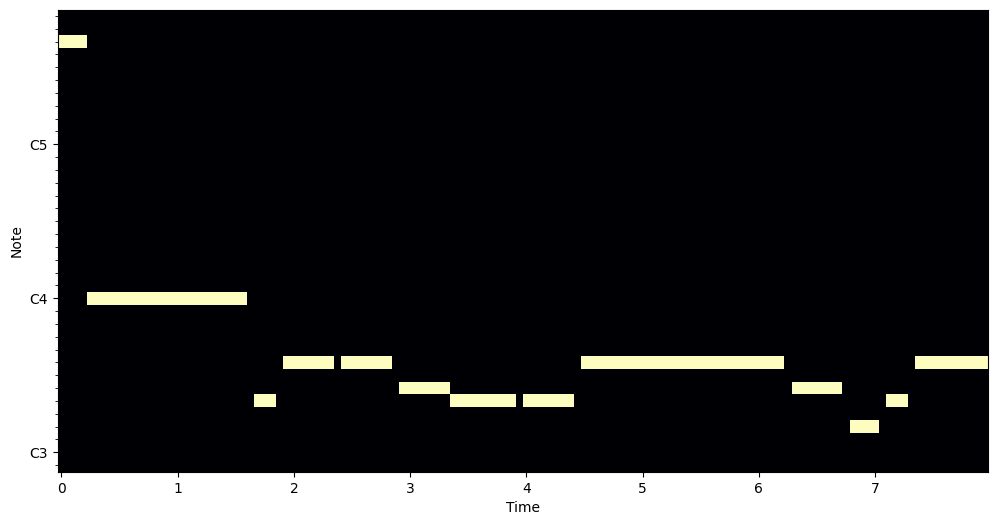

In [ ]:
# TEST GENERATION!
generation = lstm_generate(model, [129,80,80,80,80,60,60,60,60], max_seq_len=130, temp=0.5)
print("generation")
print(generation)
new_pr, new_pm = mono_seq_to_pretty_midi(generation[1:], inv_token_dict)
print("convert output")
print(new_pr)
print(new_pm)
print(len(new_pr[0]))
plot_piano_roll(new_pm, len(new_pr[0]))


In [ ]:
display_audio(new_pm)

## Part 4 Transformers (30 points)

4.1 Fill in the forward function of the transformer model below. You will need to embed the source sequence, add the positional encoding, send it through the transformer with a square causal mask (see `nn.Transformer.generate_square_subsequent_mask`), and then use a linear layer afterward to get predictions similar to the LSTM model. (10 points)

In [15]:
from torch import nn, Tensor
import torch
import torch.nn as nn
from torch.nn import TransformerEncoder, TransformerEncoderLayer
import math
import os
from tempfile import TemporaryDirectory
from typing import Tuple
from torch.utils.data import dataset

BOS_IDX, EOS_IDX = 129, 130 # 131

# helper Module that adds positional encoding to the token embedding to introduce a notion of word order.
class PositionalEncoding(nn.Module):

    def __init__(self, d_model: int, dropout: float = 0.1, max_len: int = 5000):
        super().__init__()
        self.dropout = nn.Dropout(p=dropout)

        position = torch.arange(max_len).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2) * (-math.log(10000.0) / d_model))
        pe = torch.zeros(max_len, 1, d_model)
        pe[:, 0, 0::2] = torch.sin(position * div_term)
        pe[:, 0, 1::2] = torch.cos(position * div_term)
        self.register_buffer('pe', pe)

    def forward(self, x: Tensor) -> Tensor:
        """
        Arguments:
            x: Tensor, shape ``[seq_len, batch_size, embedding_dim]``
        """
        x = x + self.pe[:x.size(0)]
        return self.dropout(x)

class TransformerModel(nn.Module):

    def __init__(self, ntoken: int, d_model: int, nhead: int, d_hid: int,
                 nlayers: int, dropout: float = 0.5):
        super().__init__()
        self.model_type = 'Transformer'
        self.pos_encoder = PositionalEncoding(d_model, dropout)
        encoder_layers = TransformerEncoderLayer(d_model, nhead, d_hid, dropout)
        self.transformer_encoder = TransformerEncoder(encoder_layers, nlayers)
        self.embedding = nn.Embedding(ntoken, d_model)
        self.d_model = d_model
        self.linear = nn.Linear(d_model, ntoken)

        self.init_weights()

    def init_weights(self) -> None:
        initrange = 0.1
        self.embedding.weight.data.uniform_(-initrange, initrange)
        self.linear.bias.data.zero_()
        self.linear.weight.data.uniform_(-initrange, initrange)

    def forward(self, src): # TO DO
        """
        Arguments:
            src: Tensor of shape ``[seq_len, batch_size]``
        Returns:
            output Tensor of shape ``[seq_len, batch_size, ntoken]``
        """
        src = self.embedding(src) * math.sqrt(self.d_model)
        src = self.pos_encoder(src)
        src_mask = nn.Transformer.generate_square_subsequent_mask(len(src)).to(device)
        output = self.transformer_encoder(src, src_mask)
        output = self.linear(output)
        return output

torch.manual_seed(0)

In [16]:
### HELPER FUNCTION FOR BATCH STUFF ###
def get_batch(train_seqs, i, bs=4):
  seqs = []
  for j in range(bs):
    seqs.append(train_seqs[i*bs + j])
  seqs = torch.LongTensor(seqs).T
  source = seqs[:-1]
  target = seqs[1:].reshape(-1)

  return source, target

**4.2** Define a transformer using the class constructor above. Also define an Adam optimizer and use cross entropy loss as the criterion. (5 points)

In [17]:
ntokens = 131  # size of vocabulary
emsize = 512  # embedding dimension
d_hid = 512 # dimension of the feedforward network model in ``nn.TransformerEncoder``
nlayers = 4  # number of ``nn.TransformerEncoderLayer`` in ``nn.TransformerEncoder``
nhead = 8  # number of heads in ``nn.MultiheadAttention``
dropout = 0.2  # dropout probability
transformer = TransformerModel(ntokens, emsize, nhead, d_hid, nlayers, dropout).to(device)
optimizer = torch.optim.Adam(transformer.parameters(), lr=.001)
criterion = torch.nn.CrossEntropyLoss()
# Leave the rest of these alone
bs = 1
seq_len = 129
num_epochs = 10
best_test_loss = float('inf')
best_model_params = None
log_interval=200 # for progress updates

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:286: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


**4.3** Write a training loop for the model. Use the `get_batch` function above to generate the data and targets for the predictions. You can use `torch.nn.utils.clip_grad_norm_` with a clip value of 0.25 to try to improve performance. (10 points)

In [18]:
import time

for e in range(num_epochs): # TO DO
  epoch_loss = 0
  epoch_test_loss = 0
  transformer.train()
  for i in range(len(train_seqs)):
    ### TO DO: TRAINING LOOP ###
    #print("Train!")
    sourcea, targeta = get_batch(train_seqs, i, 1)
    source = sourcea.to(device)
    target = targeta.to(device)
    output = transformer(source)
    output = output.view(-1, ntokens)
    loss = criterion(output,target)

    transformer.zero_grad()
    loss.backward()
    torch.nn.utils.clip_grad_norm_(transformer.parameters(), .25)
    epoch_loss += loss.item()
    optimizer.step()



    if i % log_interval == 0 and i > 0:
      #lr = scheduler.get_last_lr()[0]
      cur_loss = epoch_loss / i
      print(f'| epoch {e:3d} | i {i:3d} |'
            f'loss {cur_loss:5.2f}')

  transformer.eval()
  for i in tqdm(range(len(test_seqs))):
    ### TO DO: EVAL LOOP ###
    # print("Eval!")
    with torch.no_grad():
        sourcea, targeta = get_batch(test_seqs, i, 1)
        source = sourcea.to(device)
        target = targeta.to(device)
        length = source.size(0)
        output = transformer(source)
        output = output.view(-1, ntokens)
        epoch_test_loss += length * criterion(output, target).item()

  print(e, epoch_loss/len(train_seqs), epoch_test_loss/len(test_seqs))

  if epoch_test_loss < best_test_loss:
    print("BEAT OLD ONES!")
    best_test_loss = epoch_test_loss
    best_model_params = {
        'model_state_dict':transformer.state_dict(),
        'optimizer_state_dict':optimizer.state_dict()}

| epoch   0 | i 200 |loss  4.44
| epoch   0 | i 400 |loss  4.23
| epoch   0 | i 600 |loss  4.11
| epoch   0 | i 800 |loss  4.03
| epoch   0 | i 1000 |loss  4.02
| epoch   0 | i 1200 |loss  3.97
| epoch   0 | i 1400 |loss  3.94
| epoch   0 | i 1600 |loss  3.90
| epoch   0 | i 1800 |loss  3.88
| epoch   0 | i 2000 |loss  3.86
| epoch   0 | i 2200 |loss  3.84
| epoch   0 | i 2400 |loss  3.83
| epoch   0 | i 2600 |loss  3.81
| epoch   0 | i 2800 |loss  3.80
| epoch   0 | i 3000 |loss  3.78
| epoch   0 | i 3200 |loss  3.77
| epoch   0 | i 3400 |loss  3.76
| epoch   0 | i 3600 |loss  3.75
| epoch   0 | i 3800 |loss  3.74
| epoch   0 | i 4000 |loss  3.73
| epoch   0 | i 4200 |loss  3.73
| epoch   0 | i 4400 |loss  3.72
| epoch   0 | i 4600 |loss  3.71
| epoch   0 | i 4800 |loss  3.72
| epoch   0 | i 5000 |loss  3.71
| epoch   0 | i 5200 |loss  3.70
| epoch   0 | i 5400 |loss  3.70
| epoch   0 | i 5600 |loss  3.69
| epoch   0 | i 5800 |loss  3.69
| epoch   0 | i 6000 |loss  3.69
| epoch   0 | 

100%|██████████| 2566/2566 [00:06<00:00, 370.75it/s]


0 3.6206137946733516 475.3935200700236
BEAT OLD ONES!
| epoch   1 | i 200 |loss  3.50
| epoch   1 | i 400 |loss  3.57
| epoch   1 | i 600 |loss  3.58
| epoch   1 | i 800 |loss  3.56
| epoch   1 | i 1000 |loss  3.56
| epoch   1 | i 1200 |loss  3.55
| epoch   1 | i 1400 |loss  3.56
| epoch   1 | i 1600 |loss  3.56
| epoch   1 | i 1800 |loss  3.56
| epoch   1 | i 2000 |loss  3.56
| epoch   1 | i 2200 |loss  3.56
| epoch   1 | i 2400 |loss  3.57
| epoch   1 | i 2600 |loss  3.57
| epoch   1 | i 2800 |loss  3.56
| epoch   1 | i 3000 |loss  3.57
| epoch   1 | i 3200 |loss  3.57
| epoch   1 | i 3400 |loss  3.56
| epoch   1 | i 3600 |loss  3.56
| epoch   1 | i 3800 |loss  3.56
| epoch   1 | i 4000 |loss  3.56
| epoch   1 | i 4200 |loss  3.56
| epoch   1 | i 4400 |loss  3.57
| epoch   1 | i 4600 |loss  3.56
| epoch   1 | i 4800 |loss  3.57
| epoch   1 | i 5000 |loss  3.57
| epoch   1 | i 5200 |loss  3.57
| epoch   1 | i 5400 |loss  3.57
| epoch   1 | i 5600 |loss  3.57
| epoch   1 | i 5800 |loss

100%|██████████| 2566/2566 [00:08<00:00, 317.13it/s]


1 3.5901519504596 470.02328031163427
BEAT OLD ONES!
| epoch   2 | i 200 |loss  3.50
| epoch   2 | i 400 |loss  3.57
| epoch   2 | i 600 |loss  3.58
| epoch   2 | i 800 |loss  3.57
| epoch   2 | i 1000 |loss  3.57
| epoch   2 | i 1200 |loss  3.55
| epoch   2 | i 1400 |loss  3.56
| epoch   2 | i 1600 |loss  3.56
| epoch   2 | i 1800 |loss  3.57
| epoch   2 | i 2000 |loss  3.57
| epoch   2 | i 2200 |loss  3.57
| epoch   2 | i 2400 |loss  3.57
| epoch   2 | i 2600 |loss  3.57
| epoch   2 | i 2800 |loss  3.57
| epoch   2 | i 3000 |loss  3.57
| epoch   2 | i 3200 |loss  3.57
| epoch   2 | i 3400 |loss  3.57
| epoch   2 | i 3600 |loss  3.57
| epoch   2 | i 3800 |loss  3.56
| epoch   2 | i 4000 |loss  3.57
| epoch   2 | i 4200 |loss  3.57
| epoch   2 | i 4400 |loss  3.57
| epoch   2 | i 4600 |loss  3.57
| epoch   2 | i 4800 |loss  3.57
| epoch   2 | i 5000 |loss  3.57
| epoch   2 | i 5200 |loss  3.57
| epoch   2 | i 5400 |loss  3.57
| epoch   2 | i 5600 |loss  3.57
| epoch   2 | i 5800 |loss  

100%|██████████| 2566/2566 [00:08<00:00, 318.71it/s]


2 3.5445798219610025 449.78533123144393
BEAT OLD ONES!
| epoch   3 | i 200 |loss  3.36
| epoch   3 | i 400 |loss  3.46
| epoch   3 | i 600 |loss  3.47
| epoch   3 | i 800 |loss  3.47
| epoch   3 | i 1000 |loss  3.47
| epoch   3 | i 1200 |loss  3.46
| epoch   3 | i 1400 |loss  3.47
| epoch   3 | i 1600 |loss  3.46
| epoch   3 | i 1800 |loss  3.47
| epoch   3 | i 2000 |loss  3.46
| epoch   3 | i 2200 |loss  3.46
| epoch   3 | i 2400 |loss  3.46
| epoch   3 | i 2600 |loss  3.46
| epoch   3 | i 2800 |loss  3.45
| epoch   3 | i 3000 |loss  3.45
| epoch   3 | i 3200 |loss  3.45
| epoch   3 | i 3400 |loss  3.45
| epoch   3 | i 3600 |loss  3.44
| epoch   3 | i 3800 |loss  3.44
| epoch   3 | i 4000 |loss  3.44
| epoch   3 | i 4200 |loss  3.44
| epoch   3 | i 4400 |loss  3.44
| epoch   3 | i 4600 |loss  3.44
| epoch   3 | i 4800 |loss  3.44
| epoch   3 | i 5000 |loss  3.44
| epoch   3 | i 5200 |loss  3.44
| epoch   3 | i 5400 |loss  3.44
| epoch   3 | i 5600 |loss  3.44
| epoch   3 | i 5800 |los

100%|██████████| 2566/2566 [00:07<00:00, 330.86it/s]


3 3.33300959017931 421.5620448657617
BEAT OLD ONES!
| epoch   4 | i 200 |loss  3.11
| epoch   4 | i 400 |loss  3.16
| epoch   4 | i 600 |loss  3.17
| epoch   4 | i 800 |loss  3.15
| epoch   4 | i 1000 |loss  3.15
| epoch   4 | i 1200 |loss  3.14
| epoch   4 | i 1400 |loss  3.15
| epoch   4 | i 1600 |loss  3.15
| epoch   4 | i 1800 |loss  3.17
| epoch   4 | i 2000 |loss  3.17
| epoch   4 | i 2200 |loss  3.18
| epoch   4 | i 2400 |loss  3.18
| epoch   4 | i 2600 |loss  3.19
| epoch   4 | i 2800 |loss  3.19
| epoch   4 | i 3000 |loss  3.19
| epoch   4 | i 3200 |loss  3.19
| epoch   4 | i 3400 |loss  3.20
| epoch   4 | i 3600 |loss  3.19
| epoch   4 | i 3800 |loss  3.19
| epoch   4 | i 4000 |loss  3.19
| epoch   4 | i 4200 |loss  3.19
| epoch   4 | i 4400 |loss  3.20
| epoch   4 | i 4600 |loss  3.20
| epoch   4 | i 4800 |loss  3.20
| epoch   4 | i 5000 |loss  3.20
| epoch   4 | i 5200 |loss  3.20
| epoch   4 | i 5400 |loss  3.20
| epoch   4 | i 5600 |loss  3.20
| epoch   4 | i 5800 |loss  

100%|██████████| 2566/2566 [00:07<00:00, 329.40it/s]


4 3.1874145038932604 428.148535835585
| epoch   5 | i 200 |loss  3.23
| epoch   5 | i 400 |loss  3.32
| epoch   5 | i 600 |loss  3.31
| epoch   5 | i 800 |loss  3.28
| epoch   5 | i 1000 |loss  3.29
| epoch   5 | i 1200 |loss  3.27
| epoch   5 | i 1400 |loss  3.29
| epoch   5 | i 1600 |loss  3.30
| epoch   5 | i 1800 |loss  3.32
| epoch   5 | i 2000 |loss  3.34
| epoch   5 | i 2200 |loss  3.34
| epoch   5 | i 2400 |loss  3.35
| epoch   5 | i 2600 |loss  3.35
| epoch   5 | i 2800 |loss  3.34
| epoch   5 | i 3000 |loss  3.34
| epoch   5 | i 3200 |loss  3.34
| epoch   5 | i 3400 |loss  3.33
| epoch   5 | i 3600 |loss  3.33
| epoch   5 | i 3800 |loss  3.32
| epoch   5 | i 4000 |loss  3.32
| epoch   5 | i 4200 |loss  3.31
| epoch   5 | i 4400 |loss  3.32
| epoch   5 | i 4600 |loss  3.31
| epoch   5 | i 4800 |loss  3.31
| epoch   5 | i 5000 |loss  3.31
| epoch   5 | i 5200 |loss  3.31
| epoch   5 | i 5400 |loss  3.30
| epoch   5 | i 5600 |loss  3.30
| epoch   5 | i 5800 |loss  3.30
| epoch  

100%|██████████| 2566/2566 [00:07<00:00, 333.86it/s]


5 3.218036462432827 424.7144452923922
| epoch   6 | i 200 |loss  3.10
| epoch   6 | i 400 |loss  3.14
| epoch   6 | i 600 |loss  3.14
| epoch   6 | i 800 |loss  3.11
| epoch   6 | i 1000 |loss  3.11
| epoch   6 | i 1200 |loss  3.11
| epoch   6 | i 1400 |loss  3.11
| epoch   6 | i 1600 |loss  3.11
| epoch   6 | i 1800 |loss  3.12
| epoch   6 | i 2000 |loss  3.12
| epoch   6 | i 2200 |loss  3.12
| epoch   6 | i 2400 |loss  3.12
| epoch   6 | i 2600 |loss  3.12
| epoch   6 | i 2800 |loss  3.12
| epoch   6 | i 3000 |loss  3.13
| epoch   6 | i 3200 |loss  3.13
| epoch   6 | i 3400 |loss  3.13
| epoch   6 | i 3600 |loss  3.13
| epoch   6 | i 3800 |loss  3.13
| epoch   6 | i 4000 |loss  3.13
| epoch   6 | i 4200 |loss  3.13
| epoch   6 | i 4400 |loss  3.14
| epoch   6 | i 4600 |loss  3.14
| epoch   6 | i 4800 |loss  3.15
| epoch   6 | i 5000 |loss  3.15
| epoch   6 | i 5200 |loss  3.15
| epoch   6 | i 5400 |loss  3.16
| epoch   6 | i 5600 |loss  3.16
| epoch   6 | i 5800 |loss  3.16
| epoch  

100%|██████████| 2566/2566 [00:07<00:00, 324.11it/s]


6 3.1038630655083193 446.75275736656954
| epoch   7 | i 200 |loss  3.01
| epoch   7 | i 400 |loss  3.04
| epoch   7 | i 600 |loss  3.03
| epoch   7 | i 800 |loss  3.02
| epoch   7 | i 1000 |loss  3.04
| epoch   7 | i 1200 |loss  3.03
| epoch   7 | i 1400 |loss  3.04
| epoch   7 | i 1600 |loss  3.03
| epoch   7 | i 1800 |loss  3.04
| epoch   7 | i 2000 |loss  3.04
| epoch   7 | i 2200 |loss  3.05
| epoch   7 | i 2400 |loss  3.04
| epoch   7 | i 2600 |loss  3.04
| epoch   7 | i 2800 |loss  3.04
| epoch   7 | i 3000 |loss  3.05
| epoch   7 | i 3200 |loss  3.05
| epoch   7 | i 3400 |loss  3.05
| epoch   7 | i 3600 |loss  3.05
| epoch   7 | i 3800 |loss  3.05
| epoch   7 | i 4000 |loss  3.05
| epoch   7 | i 4200 |loss  3.05
| epoch   7 | i 4400 |loss  3.05
| epoch   7 | i 4600 |loss  3.05
| epoch   7 | i 4800 |loss  3.05
| epoch   7 | i 5000 |loss  3.05
| epoch   7 | i 5200 |loss  3.05
| epoch   7 | i 5400 |loss  3.05
| epoch   7 | i 5600 |loss  3.05
| epoch   7 | i 5800 |loss  3.05
| epoch

100%|██████████| 2566/2566 [00:07<00:00, 324.64it/s]


7 2.9731686736416454 407.13287695873
BEAT OLD ONES!
| epoch   8 | i 200 |loss  2.77
| epoch   8 | i 400 |loss  2.85
| epoch   8 | i 600 |loss  2.85
| epoch   8 | i 800 |loss  2.84
| epoch   8 | i 1000 |loss  2.84
| epoch   8 | i 1200 |loss  2.84
| epoch   8 | i 1400 |loss  2.85
| epoch   8 | i 1600 |loss  2.84
| epoch   8 | i 1800 |loss  2.85
| epoch   8 | i 2000 |loss  2.85
| epoch   8 | i 2200 |loss  2.85
| epoch   8 | i 2400 |loss  2.85
| epoch   8 | i 2600 |loss  2.85
| epoch   8 | i 2800 |loss  2.85
| epoch   8 | i 3000 |loss  2.85
| epoch   8 | i 3200 |loss  2.85
| epoch   8 | i 3400 |loss  2.84
| epoch   8 | i 3600 |loss  2.84
| epoch   8 | i 3800 |loss  2.84
| epoch   8 | i 4000 |loss  2.84
| epoch   8 | i 4200 |loss  2.84
| epoch   8 | i 4400 |loss  2.84
| epoch   8 | i 4600 |loss  2.83
| epoch   8 | i 4800 |loss  2.84
| epoch   8 | i 5000 |loss  2.84
| epoch   8 | i 5200 |loss  2.84
| epoch   8 | i 5400 |loss  2.84
| epoch   8 | i 5600 |loss  2.84
| epoch   8 | i 5800 |loss  

100%|██████████| 2566/2566 [00:07<00:00, 344.47it/s]


8 2.803897544040468 390.44531704533034
BEAT OLD ONES!
| epoch   9 | i 200 |loss  2.67
| epoch   9 | i 400 |loss  2.72
| epoch   9 | i 600 |loss  2.72
| epoch   9 | i 800 |loss  2.72
| epoch   9 | i 1000 |loss  2.72
| epoch   9 | i 1200 |loss  2.71
| epoch   9 | i 1400 |loss  2.71
| epoch   9 | i 1600 |loss  2.71
| epoch   9 | i 1800 |loss  2.71
| epoch   9 | i 2000 |loss  2.71
| epoch   9 | i 2200 |loss  2.72
| epoch   9 | i 2400 |loss  2.72
| epoch   9 | i 2600 |loss  2.72
| epoch   9 | i 2800 |loss  2.72
| epoch   9 | i 3000 |loss  2.72
| epoch   9 | i 3200 |loss  2.72
| epoch   9 | i 3400 |loss  2.72
| epoch   9 | i 3600 |loss  2.72
| epoch   9 | i 3800 |loss  2.71
| epoch   9 | i 4000 |loss  2.71
| epoch   9 | i 4200 |loss  2.71
| epoch   9 | i 4400 |loss  2.71
| epoch   9 | i 4600 |loss  2.71
| epoch   9 | i 4800 |loss  2.71
| epoch   9 | i 5000 |loss  2.71
| epoch   9 | i 5200 |loss  2.71
| epoch   9 | i 5400 |loss  2.71
| epoch   9 | i 5600 |loss  2.71
| epoch   9 | i 5800 |loss

100%|██████████| 2566/2566 [00:06<00:00, 373.35it/s]

9 2.7123236650202958 363.29147160476015
BEAT OLD ONES!


In [ ]:
torch.save((transformer.state_dict()), '4_model_trained.pt')

**4.4** Finish this function that takes a transformer model and the beginning of a sequence and generates a continuation of the sequence. (5 points)

<ipython-input-49-a266def443dc>:19: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  pred_softmax = torch.nn.functional.softmax(pred[-1])


[129, 120, 120, 120, 128, 32, 30, 28, 27, 32, 128, 33, 36, 38, 35, 28, 128, 38, 29, 28, 22, 37, 23, 30, 23, 32, 25, 30, 27, 30, 35, 32, 18, 25, 30, 35, 30, 23, 32, 30, 22, 23, 32, 30, 30, 30, 23, 25, 28, 37, 30, 28, 20, 25, 20, 30, 28, 27, 27, 32, 23, 30, 128, 37, 30]
length in seconds
4.0
intrument

total notes played (dependent on fs)
60
total length of instrument.notes array
55
first 10 notes
C9
G#1
F#1
E1
D#1
G#1
A1
C2
D2
B1


<ipython-input-42-899800956e79>:21: UserWarning: Frequency axis exceeds Nyquist. Did you remember to set all spectrogram parameters in specshow?
  librosa.display.specshow(pianoroll[start_pitch:end_pitch],


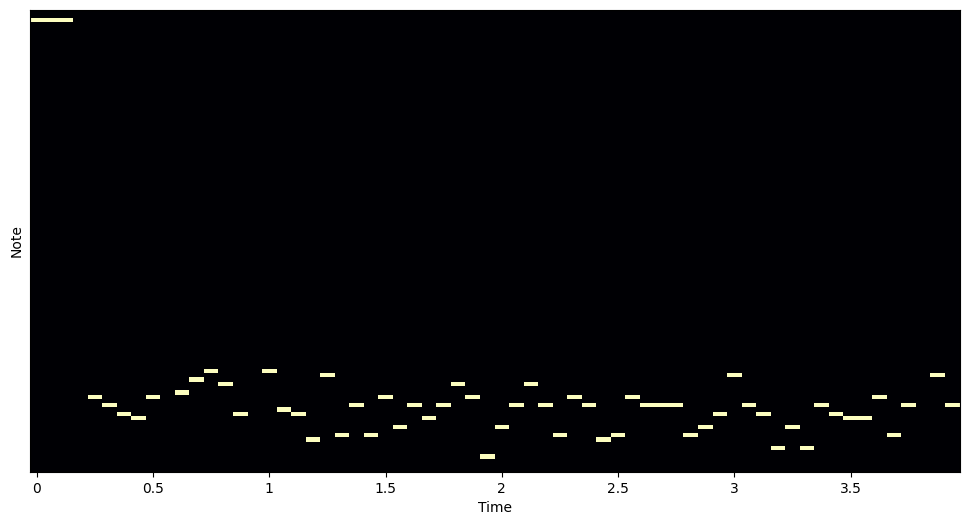

In [ ]:
def transformer_generate(model, prompt, max_seq_len, temp=1.0, seed=None):
    # BATCH SIZE MUST BE 1 #
    model.eval()
    if seed is not None:
        torch.manual_seed(seed)
    indices = [t for t in prompt]
    with torch.no_grad():
        for _ in range(max_seq_len-len(indices)):
            ### YOUR CODE HERE
            # print(indices)
            input = torch.Tensor(indices).long().to(device)
            # print(input)
            with torch.no_grad():
                prediction_array = model(input)
            # print(prediction_array)
            # print(prediction_array[-1])
            pred = prediction_array[-1]/temp
            # print(pred)
            pred_softmax = torch.nn.functional.softmax(pred[-1])
            # print(pred_softmax)

            prediction = torch.multinomial(pred_softmax, 1)

            # print(prediction)

            indices.append(prediction.item())
            if prediction == 130: #eos
                print("Break!")
                break
            #indices.append(prediction)
    return indices

generation = transformer_generate(transformer, [129,120,120,120], 65, temp=.8)
print(generation)
new_pr, new_pm = mono_seq_to_pretty_midi(generation[1:], inv_token_dict)
plot_piano_roll(new_pm, 8)

In [ ]:
display_audio(new_pm)